# Explanatory Data Analysis

### Random image sampling from dataset

In [95]:
from PIL import Image
import os
import cv2
from matplotlib import pyplot as plt
import random
import matplotlib.pyplot as plt
import numpy as np
import skimage
from sklearn.cluster import KMeans

In [96]:
all_images = []
all_images_names = []
for file in os.listdir("./data/images/256"):
    if file.endswith(".png"):
        all_images_names.append(str(file))
        image_bgr = cv2.imread(os.path.join("./data/images/256/", file))
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        all_images.append(image_rgb)

Five 256 rgb images are randomly selected from the dataset and displayed below.

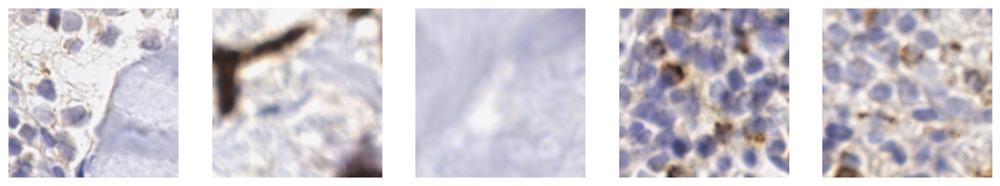

In [97]:
n_samples = 5
sample_images = []
sample_images_names = []
fig, axs = plt.subplots(1, n_samples, figsize=(15, 5))
for i in range(n_samples):
    sample_image = random.choice(all_images)
    axs[i].imshow(sample_image)
    axs[i].axis("off")
    sample_images.append(sample_image)
    #sample_images_names.append(all_images_names[all_images.index(sample_image)])

### Enhancing techniques

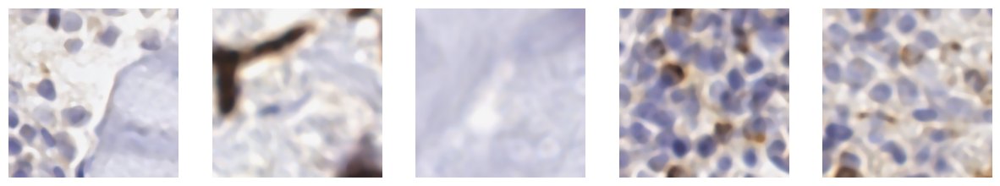

In [137]:
#Remove noise from image using median blur
fig, axs = plt.subplots(1, n_samples, figsize=(15, 5))
for i in range(n_samples):
    sample_image = sample_images[i]
    sample_image_blur = cv2.medianBlur(sample_image, 9)
    axs[i].imshow(sample_image_blur)
    axs[i].axis("off")

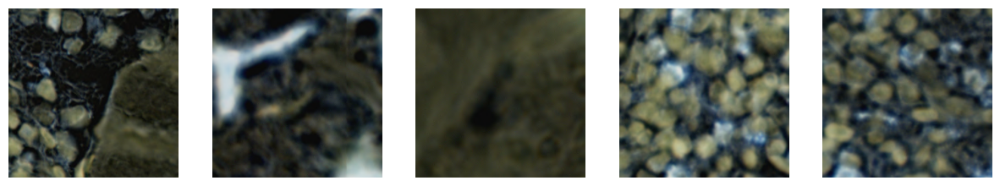

In [138]:
#Inverse the colors in the image 
fig, axs = plt.subplots(1, n_samples, figsize=(15, 5))
for i in range(n_samples):
    sample_image = sample_images[i]
    sample_image_inverted = cv2.bitwise_not(sample_image)
    axs[i].imshow(sample_image_inverted)
    axs[i].axis("off")

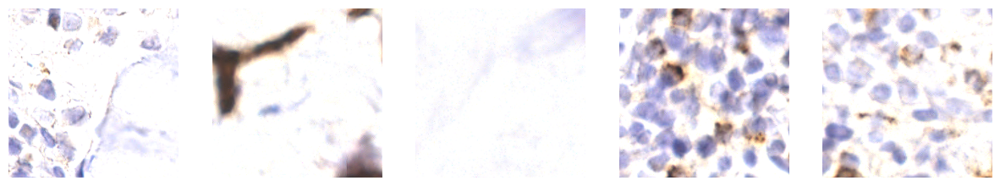

In [182]:
#Sharpen images
fig, axs = plt.subplots(1, n_samples, figsize=(15, 5))
sharpened_images = []       
for i,img in enumerate(sample_images):
    #kernel = np.array([[-1,-1,-1], [-1,8,-1], [-1,-1,-1]]) #Edge detection kernel
    kernel = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]]) #Sharpening kernel
    img = cv2.filter2D(img, -1, kernel)
    img = cv2.convertScaleAbs(img, alpha=1.25, beta=10)
    sharpened_images.append(img)
    axs[i].imshow(img)
    axs[i].axis("off")

### Color Space

Transformation of rgb image to hsv, lab and grey scale to see which color space is more suitable for segmentation.

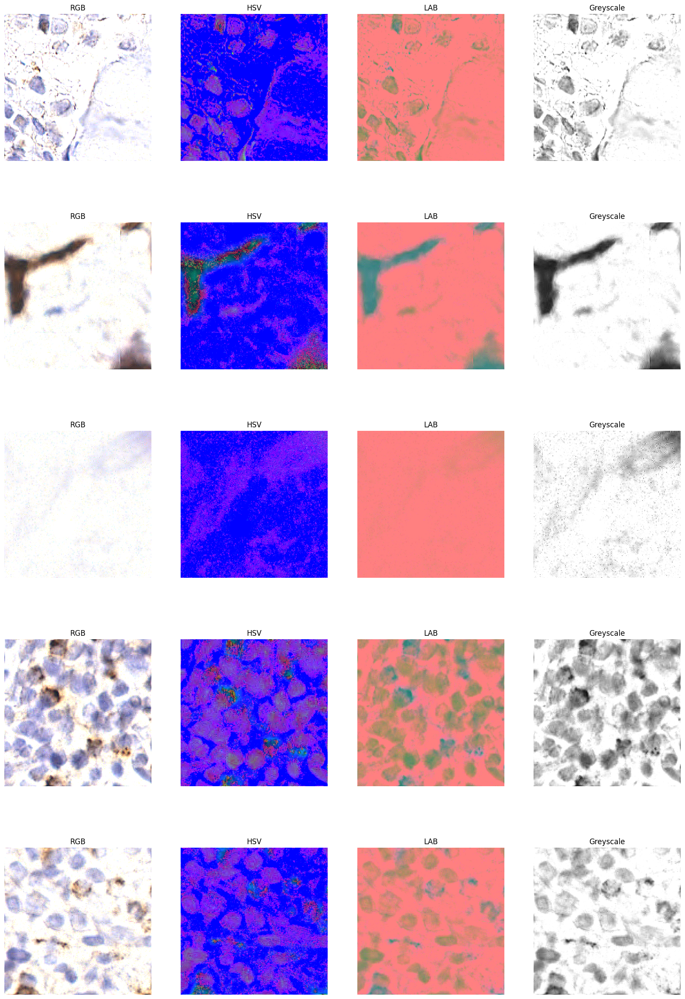

In [167]:
hsv_images = []
lab_images = []
gray_images = []
#Show in greyscale, HSV, and LAB
fig, ax = plt.subplots(n_samples, 4, figsize=(20, 30))
for i in range(n_samples):
    image = sharpened_images[i]
    ax[i, 0].imshow(image, cmap="gray")
    ax[i, 0].axis("off")
    ax[i, 0].set_title("RGB")
    image_hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    hsv_images.append(image_hsv)
    ax[i, 1].imshow(image_hsv)
    ax[i, 1].axis("off")
    ax[i, 1].set_title("HSV")
    image_lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    lab_images.append(image_lab)
    ax[i, 2].imshow(image_lab)
    ax[i, 2].axis("off")
    ax[i, 2].set_title("LAB")
    image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gray_images.append(image_gray)
    ax[i, 3].imshow(image_gray, cmap="gray")
    ax[i, 3].axis("off")
    ax[i, 3].set_title("Greyscale")


From this examples, we can see that lab color is a promising color space, as it makes easier to separate individual cells from the background. Grey scale could also work, however it adds some extra noise that maybe can be removed with some filtering. HSV is not so consistent, with some examples it works great, however in others it is not so good.

Normalize images
Gamma correction
Histogram spreading - Enhances contrast by dilating the intensity range of the image
Histogram equalization - Enhances contrast by equalizing the intensity range of the image, makes details more visible

### Tresholding

Even tough grey scale is not the best color space, it is the easiest to apply a simple thresholding to separate the cells from the background. In the example below, we can see that a simple thresholding can be used to separate the cells from the background. Maybe this can set a baseline to compare more complex methods.

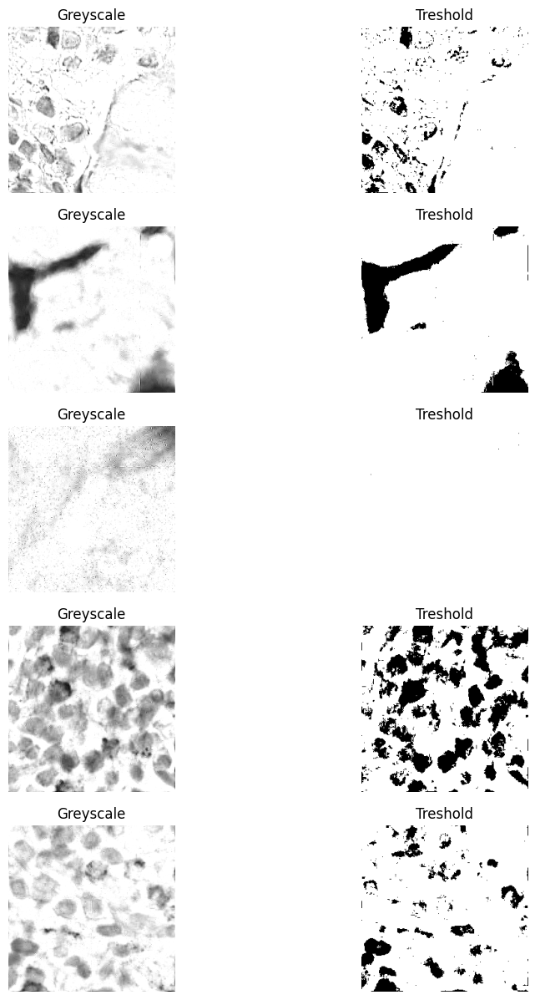

In [168]:
#Apply treshold filtering to greyscale images
images_tresh = []
fig, ax = plt.subplots(n_samples, 2, figsize=(10, 15))
for i in range(n_samples):
    image = gray_images[i]
    ret, image_tresh = cv2.threshold(image, 180 , 255, cv2.THRESH_BINARY)
    images_tresh.append(image_tresh)
    ax[i, 0].imshow(image, cmap="gray")
    ax[i, 0].axis("off")
    ax[i, 0].set_title("Greyscale")
    ax[i, 1].imshow(image_tresh, cmap="gray")
    ax[i, 1].axis("off")
    ax[i, 1].set_title("Treshold")

#### Get centroids

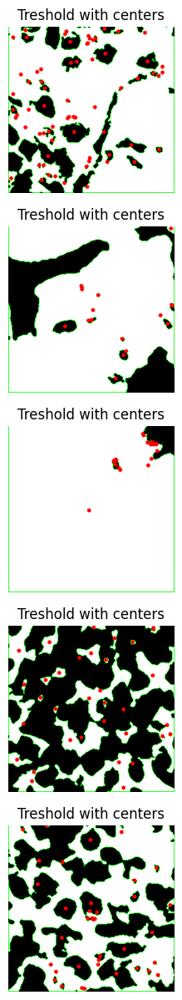

In [121]:
#Get the coordinates of the center of every black region in images with treshold
fig, ax = plt.subplots(n_samples, 1, figsize=(10, 15))
for i in range(n_samples):
    image = images_tresh[i]
    contours, _ = cv2.findContours(image, cv2.RETR_LIST , cv2.CHAIN_APPROX_NONE)
    region_centers = []
    for contour in contours:
        M = cv2.moments(contour)
        # Calculate the center coordinates of the contour
        if M["m00"] == 0:
            continue
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])

        # Append the center coordinates to the list
        region_centers.append((cX, cY))

    # Draw the centers on the image
    image_with_centers = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    cv2.drawContours(image_with_centers, contours, -1, (0, 255, 0), 1)
    for center in region_centers:
        cv2.circle(image_with_centers, center, 3, (255, 0, 0), -1)
    
    ax[i].imshow(image_with_centers)
    ax[i].axis("off")
    ax[i].set_title("Treshold with centers")

plt.show()

The center points of the masks could be used to promt SAM and extract a better segmantation, then apply classification to the segmented cells.

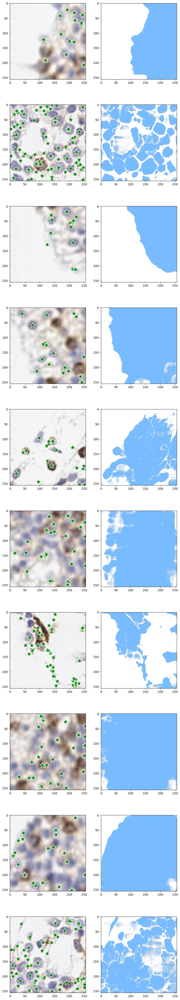

#### Get bounding boxes

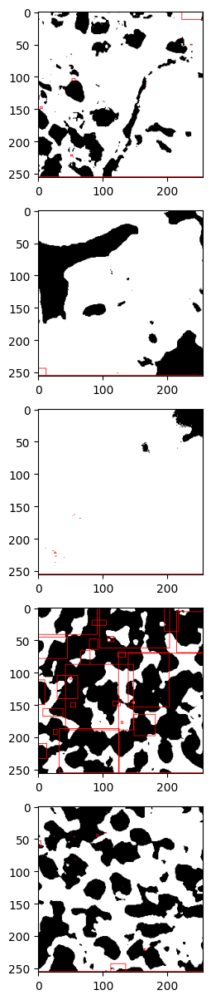

In [120]:
from scipy import ndimage

fig, ax = plt.subplots(n_samples, 1, figsize=(10, 15))
for i in range(n_samples):
    image = images_tresh[i]
    # Label connected components in the binary image
    labeled, num_regions = ndimage.label(image)

    # Initialize an empty list to store the bounding boxes of each region
    region_boxes = []

    # Iterate over each region
    for region in range(1, num_regions + 1):
        # Create a mask for the current region
        mask = np.where(labeled == region, 1, 0)

        # Find the coordinates of all pixels in the region
        coords = np.array(np.nonzero(mask)).T

        # Calculate the bounding box of the region
        x_min, y_min = coords.min(axis=0)
        x_max, y_max = coords.max(axis=0)

        # Append the bounding box to the list
        region_boxes.append(((x_min, y_min), (x_max, y_max)))

    # Draw the bounding boxes on the image
    image_with_boxes = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    for box in region_boxes:
        cv2.rectangle(image_with_boxes, box[0], box[1], (255, 0, 0), 1)

    ax[i].imshow(image_with_boxes)

plt.show()


Even worst than extracting the points

### K-means clustering

K-means clustering is applied to the lab color space to segment the cells from the background. We explore how does it work with different number of clusters.

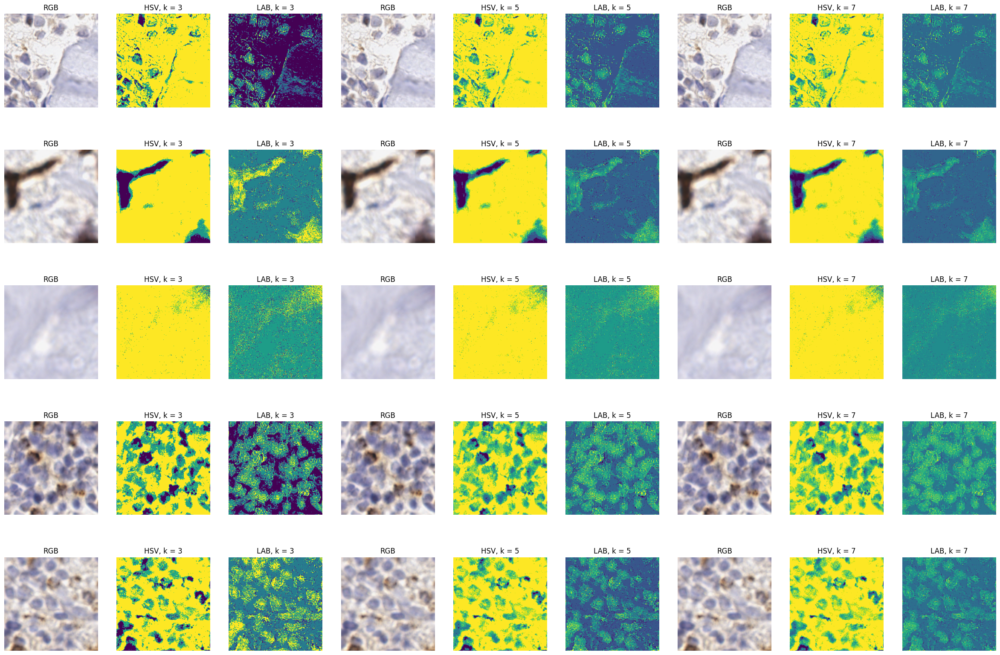

In [169]:
# Apply k-means clustering to the HSV and LAB images for k =3, 5, 7
k_values = [3, 5, 7]
fig, axs = plt.subplots(n_samples, len(k_values)*3, figsize=(30, 20))
for i in range(n_samples):
    for j in range(len(k_values)):
        k = k_values[j]
        image_hsv = hsv_images[i]
        image_lab = lab_images[i]
        h,s,v = cv2.split(image_hsv)
        v1 = v.reshape(v.shape[0]*v.shape[1], 1)
        kmeans = KMeans(n_clusters=k, random_state=0).fit(v1)
        p1s = kmeans.cluster_centers_[kmeans.labels_]
        icv = p1s.reshape(v.shape[0],v.shape[1])
        labels_hsv = icv.astype(np.uint8)
        l,a,b = cv2.split(image_lab)
        i2 = a.reshape(a.shape[0]*a.shape[1], 1)
        kmeans = KMeans(n_clusters=k, random_state=0).fit(i2)
        p2s = kmeans.cluster_centers_[kmeans.labels_]
        ic = p2s.reshape(a.shape[0],a.shape[1])
        labels_lab = ic.astype(np.uint8)
        axs[i, j*3].imshow(sample_images[i])
        axs[i, j*3].axis("off")
        axs[i, j*3].set_title("RGB")
        axs[i, j*3+1].imshow(labels_hsv, cmap="viridis")
        axs[i, j*3+1].axis("off")
        axs[i, j*3+1].set_title("HSV, k = " + str(k))
        axs[i, j*3+2].imshow(labels_lab, cmap="viridis")
        axs[i, j*3+2].axis("off")
        axs[i, j*3+2].set_title("LAB, k = " + str(k))

